<a href="https://colab.research.google.com/github/fcastellanosp/MINE-4206_202410_AML/blob/main/Talleres/Taller%205/Taller%205.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

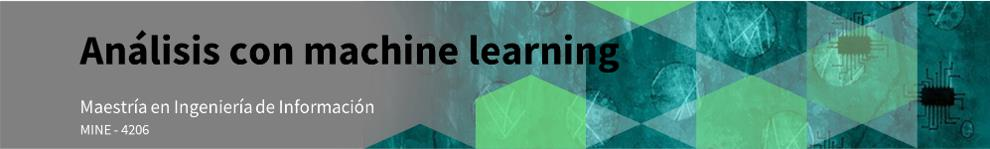

- **Integrante 1:** María Catalina Ibáñez Piñeres
- **Integrante 2:** Lina María Gómez Mesa

---
# Contexto y objetivos.

Uno de los esquemas más importantes que han evolucionado gracias a la tecnología es el ambiente financiero. El cual ha facilitado a los usuarios préstamos a sus clientes para diferentes inversiones que puedan requerir los usuarios y generar utilidades mediante este tipo de transacciones.

Los bancos incurren en pérdidas cuando un cliente no paga sus préstamos a tiempo. Debido a esto, cada año, los bancos tienen pérdidas en crores, y esto también impacta en gran medida el crecimiento económico del país. En este hackathon, analizamos varios atributos como el monto financiado, la ubicación, el préstamo, el saldo, etc., para predecir si una persona será un incumplidor de préstamos o no.

Por esta razón, la entidad financiera cuenta con una base de datos que registra la información de los préstamos y el estado de cartera, dónde se conoce si el usuario se encuentra o no en mora.

**Objetivos de desarrollo**:

* Resolver un problema de detección de anomalías.
* Realizar el entrenamiento de una sola clase.
* Analizar la Arquitectura de los AutoEncoders.
* Guardar el el autoencoder entrenado en modo competencia.

**Datos**: La fuente de datos inicial fue tomada del dataset [Bank Loan Defaulter Prediction](https://www.kaggle.com/datasets/ankitkalauni/bank-loan-defaulter-prediction-hackathon), no obstante, la información ha sido preparada para trabajar en el modelamiento.

# Entendimiento del negocio.

Para tener un mejor detalle sobre el comportamiento de las variables, solicitamos a la organización el diccionario de datos y nos suministró la siguiente información:

| ATRIBUTO | DEFINICIÓN |
| :- | :- |
| **ID** | Identificador único de la instancia.|
| **Loan Amount** | Valor del monto del préstamo.|
| **Funded Amount** | Valor financiado del préstamo.|
| **Funded Amount Investor** | Inversor de la canidad financiada.|
| **Term** | Plazo del préstamo (en meses).|
| **Interest Rate** | Tasa de interés del préstamo.|
| **Grade** | Calificación del banco.|
| **Employment Duration** | Tiempo laborado.|
| **Home Ownership** | Propietario de la vivienda.|
| **Verification Status** | Estado de verificación de ingresos por parte del banco.|
| **Debit to Income** | Relación entre el pago mensual de la dueda, dividida entre los ingresos mensuales autodeclarados. Exlucye la hipoteca. |
| **Delinquency - two years** | Tiempo reportado como moroso (30+número de días) en los 2 últimos años.|
| **Inquires - six months** | Número total de consultas en los 6 últimos meses.|
| **Open Account** | Número de líneas de crédito abiertas en la línea de crédito del representante.|
| **Public Record** | Número de registros públicos desfavorables.|
| **Revolving Balance** | Saldo total de crédito rotativo.|
| **Revolving Utilities** | Cantidad de crédito que está utilizando un representante en relación con **Revolving Balance**.|
| **Total Accounts** | Número total de líneas de crédito disponibles en la línea de crédito del representante.|
| **Initial List Status** | Estado de listado único del préstamo - W (En espera), F (Enviado).|
| **Total Received Interest** | Intereses totales recibidos hasta la fecha.|
| **Total Received Late Fee** | Total de tarifas por mora recibidas hasta la fecha.|
| **Recoveries** | Recuperación bruta posterior a la cancelación de la deuda.|
| **Collection Recovery Fee** | Tarifa de cobranza posterior a la cancelación de la deuda.|
| **Collection 12 months Medical** | Cobranzas totales en los últimos 12 meses excluyendo las colecciones médicas.|
| **Application Type** | Indica si la representación es individual o conjunta.|
| **Last week Pay** | Indica cuánto tiempo (en semanas) un representante ha pagado EMI después de la inscripción en el lote.|
| **Accounts Delinquent** | Número de cuentas en las que el representante está en mora.|
| **Total Collection Account** | Saldo total actual de todas las cuentas.|
| **Total Current Balance** | Saldo total actual de todas las cuentas.|
| **Total Revolving Credit Limit** | Límite total de crédito rotativo.|
| **Loan Status** | Estado de cuenta, 1 indica se encuentra en mora y 0 se encuentra al día.|

# Actividades a realizar.

1. Realizar el análisis exploratorio de la información.

2. Generar un pipeline para el tratamiento de la información.

3. Diseñar un autoencoder el cuál sea entrenado a partir de la clase normal. Tenga en cuenta que la métrica debe ser el **accuracy**. La arquitectura debe tener el número de capas que considere adecuado para el contexto de un autoencoder. Realice la interpretación de los resultados obtenidos.

4. Construir las gráficas de entrenamiento, validación. Debes interpretar los resultados obtenidos para este modelo base.

5. Realizar la identificación de hiperparámetros, justificando la elección de los valores correspondientes.

6. Reconstruir los resultados usando el mejor modelo y usando los datos de prueba. Realice el proceso de interpretación de los resultados obtenidos.

7. **Bono**: Almacena el joblib de la preparación de los datos y el autoencoder, de esta forma serán evaluados los resultados obtenidos y publicados en un ranking, los 3 mejores grupos con los resultados obtenidos evaluando datos nuevos y evaluando la métrica, obtendrán la bonificación de este taller.

**Entregables**: Debe cargar a bloque neón la siguiente información:

* Notebook ejecutado. En la última línea del notebook, especifique una variable denominada **encorder_fields**, dónde se encuentren las columnas que finalmente usará el modelo.
* Archivo HTML del notebook ejecutado.
* Joblib de preparación de datos.
* Modelo del autoencoder del mejor modelo obtenido.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import numpy as np

from sklearn.preprocessing import Normalizer, MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector

#Tensorflow y keras
import tensorflow as tf
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import Dense, Input
from keras.utils import plot_model
from keras.optimizers import Adam

/Users/mariacatalinaibanezpineres/Desktop/MAESTRIA/2024-10/Machine Learning/Talleres/Taller5/env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
normal = pd.read_csv("https://raw.githubusercontent.com/fcastellanosp/MINE-4206_202410_AML/main/Talleres/Taller%205/normal.csv")
normal

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Grade,Employment Duration,Home Ownership,Verification Status,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,65087372,10000,32236,12329.36286,59,11.135007,B,MORTGAGE,176346.62670,Not Verified,...,2.498291,0.793724,0,INDIVIDUAL,49,0,31,311301,6619,0
1,1450153,3609,11940,12191.99692,59,12.237563,C,RENT,39833.92100,Source Verified,...,2.377215,0.974821,0,INDIVIDUAL,109,0,53,182610,20885,0
2,1969101,28276,9311,21603.22455,59,12.545884,F,MORTGAGE,91506.69105,Source Verified,...,4.316277,1.020075,0,INDIVIDUAL,66,0,34,89801,26155,0
3,6651430,11170,6954,17877.15585,59,16.731201,C,MORTGAGE,108286.57590,Source Verified,...,0.107020,0.749971,0,INDIVIDUAL,39,0,40,9189,60214,0
4,14354669,16890,13226,13539.92667,59,15.008300,C,MORTGAGE,44234.82545,Source Verified,...,1294.818751,0.368953,0,INDIVIDUAL,18,0,430,126029,22579,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,7273094,11440,17672,22965.76290,59,15.025260,C,RENT,76128.78634,Verified,...,0.061096,0.325564,0,INDIVIDUAL,151,0,38,859647,21468,0
61218,35182714,8323,11046,15637.46301,59,9.972104,C,RENT,65491.12817,Source Verified,...,2.015494,1.403368,0,INDIVIDUAL,14,0,37,22692,8714,0
61219,16435904,15897,32921,12329.45775,59,19.650943,A,MORTGAGE,34813.96985,Verified,...,5.673092,1.607093,0,INDIVIDUAL,137,0,17,176857,42330,0
61220,5300325,16567,4975,21353.68465,59,13.169095,D,OWN,96938.83564,Not Verified,...,1.157454,0.207608,0,INDIVIDUAL,73,0,61,361339,39075,0


In [3]:
test = pd.read_csv("https://raw.githubusercontent.com/fcastellanosp/MINE-4206_202410_AML/main/Talleres/Taller%205/test.csv")
test

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Grade,Employment Duration,Home Ownership,Verification Status,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,2567369,13778,11656,26105.702520,59,13.382068,A,MORTGAGE,49537.72103,Verified,...,5.090907,1.171816,0,INDIVIDUAL,53,0,30,305148,1604,0
1,60690195,23891,25795,13254.362100,59,11.307417,D,MORTGAGE,72171.74951,Verified,...,6.579831,0.551025,0,INDIVIDUAL,60,0,45,151330,20090,0
2,33860189,3500,3500,3500.000000,36,10.150000,B,RENT,43000.00000,Not Verified,...,0.000000,0.000000,0,INDIVIDUAL,65,0,0,32926,8700,0
3,24927916,16588,9495,12123.544890,59,10.857981,B,RENT,66775.05376,Source Verified,...,3.165733,1.170445,0,INDIVIDUAL,10,0,25,44232,88161,0
4,8658608,9179,34461,2120.247381,59,17.392819,C,RENT,105507.03900,Source Verified,...,0.133916,0.547749,0,INDIVIDUAL,116,0,32,17616,24383,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28907,11791863,20531,14637,20873.672020,58,8.816036,C,MORTGAGE,54832.47671,Source Verified,...,8.240559,0.263531,0,INDIVIDUAL,38,0,54,107593,30035,0
28908,7781823,9048,18664,8055.725617,59,8.206810,C,RENT,64463.45373,Source Verified,...,3.930009,0.883955,0,INDIVIDUAL,2,0,28,352559,1735,1
28909,4239688,29084,31199,10128.795360,59,11.977165,C,RENT,68783.92330,Verified,...,1.619850,0.906886,0,INDIVIDUAL,6,0,59,203771,3191,0
28910,14600261,12778,21387,7615.936459,59,10.311443,D,RENT,154143.34970,Verified,...,0.823018,0.105983,0,INDIVIDUAL,36,0,38,315029,1385,0


## Punto 1 y 2: Análisis exploratorio y pipeline de datos.

### 1. Introducción a los datos

Se realiza el entendimiento de los datos a través de las siguientes etapas:
- Saber qué significa un registro en la fuente de datos
    - Identificar el tipo de datos de cada columna
- Determinar qué reglas de negocio se ven en los datos
    - Buscar dependencia entre atributos, para evaluar consistencia
- Verificar la calidad de datos
    - Evaluar los criterios de completitud, unicidad, consistencia, validez

Los pasos no se realizan en orden.

Se revisa el tipo de dato de cada atributo:

In [4]:
normal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61222 entries, 0 to 61221
Data columns (total 31 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            61222 non-null  int64  
 1   Loan Amount                   61222 non-null  int64  
 2   Funded Amount                 61222 non-null  int64  
 3   Funded Amount Investor        61222 non-null  float64
 4   Term                          61222 non-null  int64  
 5   Interest Rate                 61222 non-null  float64
 6   Grade                         61222 non-null  object 
 7   Employment Duration           61222 non-null  object 
 8   Home Ownership                61222 non-null  float64
 9   Verification Status           61222 non-null  object 
 10  Debit to Income               61222 non-null  float64
 11  Delinquency - two years       61222 non-null  int64  
 12  Inquires - six months         61222 non-null  int64  
 13  O

Se observa que, al importar los datos, las columnas Grade, Employment Duration, Verification Status, Initial List Status y Application Type se importan como object por lo tanto son categóricas.

Por otro lado, se observa que las columnas ID, Loan Amount, Funded Amount, Term, Delinquency - two years, Inquires - six months, Open Account, Public Record, Revolving Balance, Total Accounts, Collection 12 months Medical, Last week Pay, Accounts Delinquent, Total Collection Amount, Total Current Balance, Total Revolving Credit Limit y Loan Status son de tipo int64. Mientras que Funded Amount Investor, Interest Rate, Home Ownership, Debit to Income, Revolving Utilities, Total Received Interest, Total Received Late Fee, Recoveries y Collection Recovery Fee son de tipo float64.

No obstante, ID es un identificador único por lo que es categórica, se procede entonces a cambiar el tipo de dato de ID a object. Por otra lado, se observa que Loan Status es una variable booleana que toma valores 0 o 1. Por lo que se procede a cambiar el tipo de dato de Loan Status a object, porque es categórica.

Esto aún no corresponde a preparación de datos. Los datos no se modifican, únicamente se cambia el tipo de dato. De lo contrario, esta exploración de datos sería engañosa.

In [41]:
normal['ID'] = normal['ID'].astype('object')

#### 1.1. Exploración de los datos

Se muestran a continuación los estadísticos descriptivos de las variables numéricas:

In [42]:
numeric_variables = normal.select_dtypes(include=['number'])
numeric_variables

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Home Ownership,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,...,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
0,10000,32236,12329.36286,59,11.135007,176346.62670,16.284758,1,0,13,...,0.102055,2.498291,0.793724,0,49,0,31,311301,6619,0
1,3609,11940,12191.99692,59,12.237563,39833.92100,15.412409,0,0,12,...,0.036181,2.377215,0.974821,0,109,0,53,182610,20885,0
2,28276,9311,21603.22455,59,12.545884,91506.69105,28.137619,0,0,14,...,18.778660,4.316277,1.020075,0,66,0,34,89801,26155,0
3,11170,6954,17877.15585,59,16.731201,108286.57590,18.043730,1,0,7,...,0.044131,0.107020,0.749971,0,39,0,40,9189,60214,0
4,16890,13226,13539.92667,59,15.008300,44234.82545,17.209886,1,3,13,...,19.306646,1294.818751,0.368953,0,18,0,430,126029,22579,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,11440,17672,22965.76290,59,15.025260,76128.78634,21.929698,0,0,8,...,0.010722,0.061096,0.325564,0,151,0,38,859647,21468,0
61218,8323,11046,15637.46301,59,9.972104,65491.12817,17.694279,0,0,12,...,0.027095,2.015494,1.403368,0,14,0,37,22692,8714,0
61219,15897,32921,12329.45775,59,19.650943,34813.96985,10.295774,0,0,7,...,0.028212,5.673092,1.607093,0,137,0,17,176857,42330,0
61220,16567,4975,21353.68465,59,13.169095,96938.83564,7.614624,0,0,14,...,0.074508,1.157454,0.207608,0,73,0,61,361339,39075,0


In [43]:
numeric_variables.describe()

,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Home Ownership,Debit to Income,Delinquency - two years,Inquires - six months,Open Account,...,Total Received Late Fee,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
count,61222.000000,61222.00000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,...,61222.000000,61222.000000,61222.000000,61222.000000,61222.000000,61222.0,61222.000000,6.122200e+04,61222.000000,61222.0
mean,16860.853092,15767.04910,14621.996411,58.177436,11.842815,80488.081484,23.307491,0.324573,0.145667,14.280618,...,1.128288,59.765850,1.129406,0.021332,71.078665,0.0,144.592238,1.591377e+05,23113.297703,0.0
std,8357.381374,8154.68281,6776.671183,3.303851,3.711378,44982.239350,8.458977,0.793192,0.472828,6.226048,...,5.206573,357.229252,3.509474,0.144490,43.324943,0.0,733.697102,1.387621e+05,20939.928901,0.0
min,1014.000000,1014.00000,1114.590204,36.000000,5.320006,14573.537170,0.675299,0.000000,0.000000,2.000000,...,0.000003,0.000036,0.000036,0.000000,0.000000,0.0,1.000000,6.170000e+02,1000.000000,0.0
25%,10042.250000,9255.00000,9845.684836,58.000000,9.298548,51678.569317,16.760928,0.000000,0.000000,10.000000,...,0.021131,1.626781,0.478150,0.000000,35.000000,0.0,24.000000,5.025250e+04,8139.250000,0.0
50%,16087.000000,13032.00000,12806.409390,59.000000,11.376376,69274.739920,22.652777,0.000000,0.000000,13.000000,...,0.043496,3.336222,0.782344,0.000000,68.000000,0.0,35.000000,1.179930e+05,16712.500000,0.0
75%,22098.000000,21801.00000,17748.224160,59.000000,14.189447,94458.038567,30.069674,0.000000,0.000000,16.000000,...,0.071949,5.448862,1.072563,0.000000,104.000000,0.0,46.000000,2.278930e+05,32125.750000,0.0
max,35000.000000,34999.00000,34999.746430,59.000000,27.182348,406561.536400,39.629862,8.000000,5.000000,37.000000,...,42.618882,4354.467419,166.833000,1.000000,161.000000,0.0,16421.000000,1.177412e+06,201169.000000,0.0


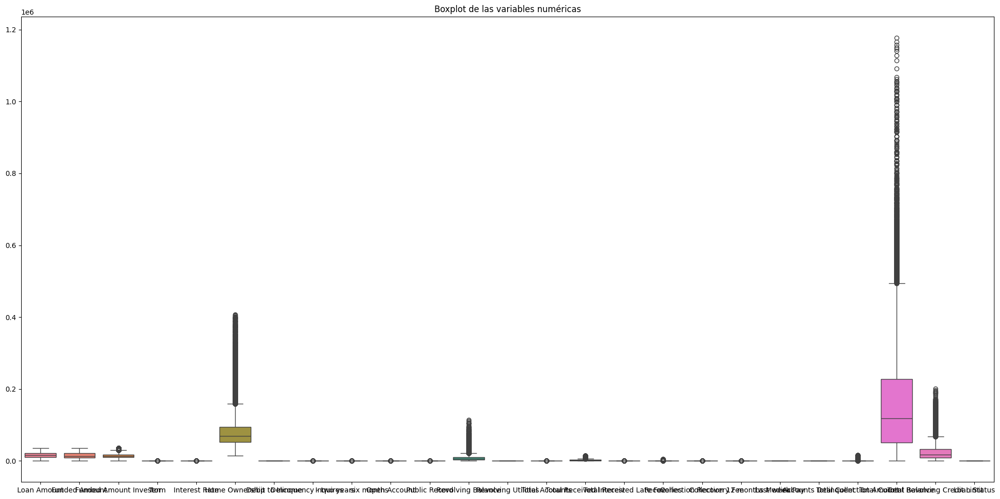

In [44]:
fig = plt.figure(figsize=(20, 10))
ax = sns.boxplot(data= numeric_variables)
plt.title('Boxplot de las variables numéricas')
plt.tight_layout()

**Insights**
- Se puede observar que los mínimos y máximos de los atributos numéricos son números razonables y se encuentran dentro de un rango esperado.

Se revisan las categorías y la frecuencia de ocurrencia de cada categoría para las variables categóricas:

In [45]:
categoric_variables = normal.select_dtypes(include=['object'])
categoric_variables

,ID,Grade,Employment Duration,Verification Status,Initial List Status,Application Type
0,65087372,B,MORTGAGE,Not Verified,w,INDIVIDUAL
1,1450153,C,RENT,Source Verified,f,INDIVIDUAL
2,1969101,F,MORTGAGE,Source Verified,w,INDIVIDUAL
3,6651430,C,MORTGAGE,Source Verified,w,INDIVIDUAL
4,14354669,C,MORTGAGE,Source Verified,w,INDIVIDUAL
...,...,...,...,...,...,...
61217,7273094,C,RENT,Verified,w,INDIVIDUAL
61218,35182714,C,RENT,Source Verified,w,INDIVIDUAL
61219,16435904,A,MORTGAGE,Verified,w,INDIVIDUAL
61220,5300325,D,OWN,Not Verified,f,INDIVIDUAL


In [46]:
text_cols_str = [text_col for text_col in  normal.select_dtypes(include=['object']).columns]
normal[text_cols_str].describe()

,ID,Grade,Employment Duration,Verification Status,Initial List Status,Application Type
count,61222,61222,61222,61222,61222,61222
unique,61222,7,3,3,2,2
top,65087372,C,MORTGAGE,Source Verified,w,INDIVIDUAL
freq,1,17293,33128,29951,33072,61110


Verificamos que los valores de cada columna categórica esten dentro de las opciones posibles.

In [47]:
categoric_variables["Grade"].unique()

array(['B', 'C', 'F', 'A', 'G', 'E', 'D'], dtype=object)

In [48]:
categoric_variables["Employment Duration"].unique()

array(['MORTGAGE', 'RENT', 'OWN'], dtype=object)

In [49]:
categoric_variables["Verification Status"].unique()

array(['Not Verified', 'Source Verified', 'Verified'], dtype=object)

In [50]:
categoric_variables["Initial List Status"].unique()

array(['w', 'f'], dtype=object)

In [51]:
categoric_variables["Application Type"].unique()

array(['INDIVIDUAL', 'JOINT'], dtype=object)

Verificamos el porcentaje de distribución de las categorías de las variables categóricas:

In [53]:
categoric_variables

,ID,Grade,Employment Duration,Verification Status,Initial List Status,Application Type
0,65087372,B,MORTGAGE,Not Verified,w,INDIVIDUAL
1,1450153,C,RENT,Source Verified,f,INDIVIDUAL
2,1969101,F,MORTGAGE,Source Verified,w,INDIVIDUAL
3,6651430,C,MORTGAGE,Source Verified,w,INDIVIDUAL
4,14354669,C,MORTGAGE,Source Verified,w,INDIVIDUAL
...,...,...,...,...,...,...
61217,7273094,C,RENT,Verified,w,INDIVIDUAL
61218,35182714,C,RENT,Source Verified,w,INDIVIDUAL
61219,16435904,A,MORTGAGE,Verified,w,INDIVIDUAL
61220,5300325,D,OWN,Not Verified,f,INDIVIDUAL


In [55]:
categorical_variables = categoric_variables[["Initial List Status", "Application Type"]]
for col in categorical_variables:
    print(f"Categorías y frecuencias para {col}")
    print(normal[col].value_counts(normalize=True))

Categorías y frecuencias para Initial List Status
Initial List Status
w    0.540198
f    0.459802
Name: proportion, dtype: float64
Categorías y frecuencias para Application Type
Application Type
INDIVIDUAL    0.998171
JOINT         0.001829
Name: proportion, dtype: float64


In [56]:
categorical_variables = categoric_variables[["Grade", "Employment Duration", "Verification Status"]]
for col in categorical_variables:
    print(f"Categorías y frecuencias para {col}")
    print(normal[col].value_counts(normalize=True))

Categorías y frecuencias para Grade
Grade
C    0.282464
B    0.279426
A    0.178939
D    0.121901
E    0.095195
F    0.032880
G    0.009196
Name: proportion, dtype: float64
Categorías y frecuencias para Employment Duration
Employment Duration
MORTGAGE    0.541113
RENT        0.356718
OWN         0.102169
Name: proportion, dtype: float64
Categorías y frecuencias para Verification Status
Verification Status
Source Verified    0.489220
Verified           0.268335
Not Verified       0.242446
Name: proportion, dtype: float64


Verificamos si existen valores nulos en el conjunto de datos.

In [57]:
pd.isna(normal).sum()

ID                              0
Loan Amount                     0
Funded Amount                   0
Funded Amount Investor          0
Term                            0
Interest Rate                   0
Grade                           0
Employment Duration             0
Home Ownership                  0
Verification Status             0
Debit to Income                 0
Delinquency - two years         0
Inquires - six months           0
Open Account                    0
Public Record                   0
Revolving Balance               0
Revolving Utilities             0
Total Accounts                  0
Initial List Status             0
Total Received Interest         0
Total Received Late Fee         0
Recoveries                      0
Collection Recovery Fee         0
Collection 12 months Medical    0
Application Type                0
Last week Pay                   0
Accounts Delinquent             0
Total Collection Amount         0
Total Current Balance           0
Total Revolvin

Verificamos si existen valores duplicados en el conjunto de datos.

In [58]:
normal.duplicated().sum()

0

Se genera un reporte completo, en formato HTML, para concluir con el proceso de perfilamiento:

In [371]:
profiling = ProfileReport(normal.copy())
profiling.to_file("profiling.html")

/Users/mariacatalinaibanezpineres/Desktop/MAESTRIA/2024-10/Machine Learning/Talleres/Taller5/env/lib/python3.11/site-packages/ydata_profiling/utils/dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)
Summarize dataset:  87%|████████▋ | 33/38 [00:00<00:00, 25.89it/s, Calculate auto correlation]                    /Users/mariacatalinaibanezpineres/Desktop/MAESTRIA/2024-10/Machine Learning/Talleres/Taller5/env/lib/python3.11/site-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this

Adicionalmente, se decide graficar la distribucion entre las variables numéricas:	

<Figure size 2500x2000 with 0 Axes>

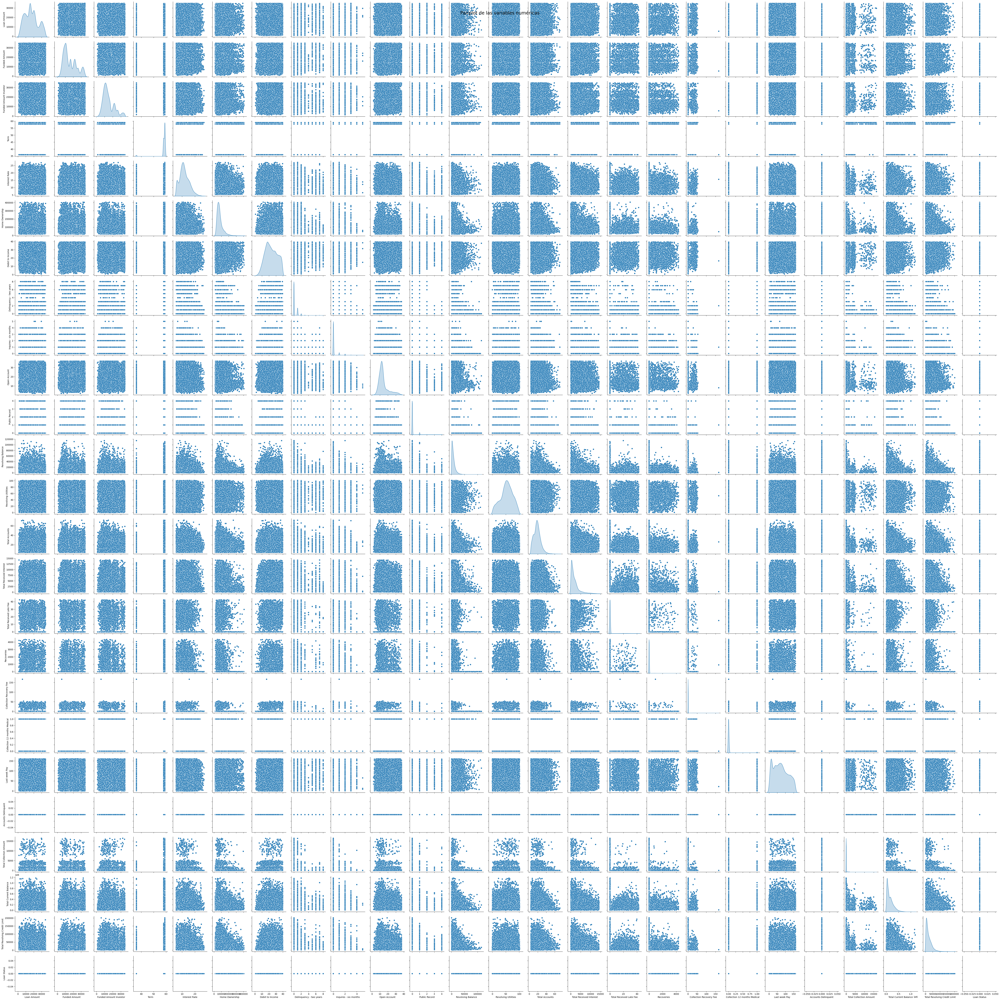

In [60]:
plt.figure(figsize=(25, 20))
train_num = normal[list(numeric_variables.columns)]

sns.pairplot(train_num, diag_kind='kde')
plt.suptitle('Pairplot de las variables numéricas', size = 20)
plt.show()

A continuación, se realiza un análisis sobre la correlación entre las variables predictoras. Un punto de base empírico para decidir si descartar una variable debido a su alta correlación es |0.8|. 

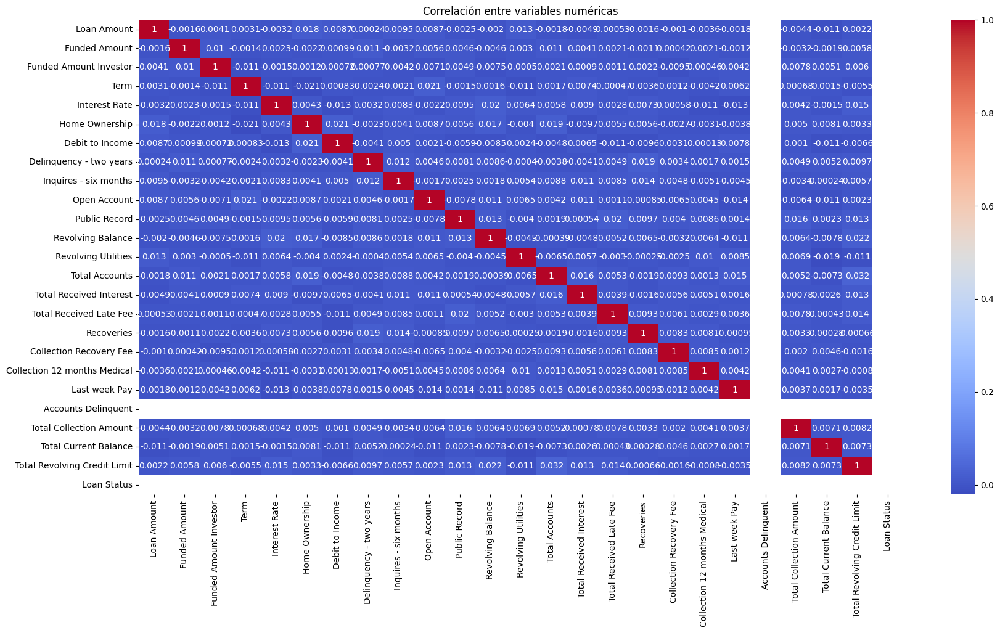

In [61]:
plt.figure(figsize = (20,10))
sns.heatmap(numeric_variables.corr(), annot = True, cmap="coolwarm")
plt.title('Correlación entre variables numéricas')
plt.show()

De acuerdo con el diccionario, lo único que se puede verificar es si las columnas son del tipo de dato que son (númerico|categórico). Para el dataset de entrenamiento se tiene de manera correcta esta información por lo que con respecto a este asunto no se presenta inconsistencia de datos. Ahora bien, con respecto a las variables numéricas es importante detectar outliers. Si la columna sigue una distribución normal, se puede utilizar la regla de oro de $\bar{x} \pm  3*std $. De lo contrario, no se puede asegurar que sean datos anómalos [1].

In [62]:
#############################################################################
# Utilizando la mediana
#############################################################################
features = list(numeric_variables.columns)
print(10*"*"+"Utilizando la mediana"+10*"*"+"\n")
for col in normal[features]:

    median = np.median(normal[col])
    mad = np.median(np.abs(normal[col] - median))
    mask = (normal[col] < (median - 3 * mad)) | (normal[col] > (median + 3 * mad))
    count = mask.sum()
    print(f"Total de datos Posiblemente anómalos en la columna {col}: {count} ({round(100*(count/normal[col].shape[0]),2)})")

**********Utilizando la mediana**********

Total de datos Posiblemente anómalos en la columna Loan Amount: 594 (0.97)
Total de datos Posiblemente anómalos en la columna Funded Amount: 6541 (10.68)
Total de datos Posiblemente anómalos en la columna Funded Amount Investor: 7044 (11.51)
Total de datos Posiblemente anómalos en la columna Term: 21693 (35.43)
Total de datos Posiblemente anómalos en la columna Interest Rate: 3126 (5.11)
Total de datos Posiblemente anómalos en la columna Home Ownership: 7217 (11.79)
Total de datos Posiblemente anómalos en la columna Debit to Income: 55 (0.09)
Total de datos Posiblemente anómalos en la columna Delinquency - two years: 13945 (22.78)
Total de datos Posiblemente anómalos en la columna Inquires - six months: 6335 (10.35)
Total de datos Posiblemente anómalos en la columna Open Account: 7322 (11.96)
Total de datos Posiblemente anómalos en la columna Public Record: 4124 (6.74)
Total de datos Posiblemente anómalos en la columna Revolving Balance: 6865 

In [63]:
#############################################################################
# Utilizando la media
#############################################################################
print("\n"+10*"*"+"Utilizando la media"+10*"*"+"\n")
for col in normal[features]:

    mean = normal[col].mean()
    std = normal[col].std()

    mask = (normal[col] < (mean - 3 * std)) | (normal[col] > (mean + 3 * std))
    count = mask.sum()
    print(f"Total de datos Posiblemente anómalos en la columna {col}: {count} ({round(100*(count/normal[col].shape[0]),2)})")


**********Utilizando la media**********

Total de datos Posiblemente anómalos en la columna Loan Amount: 0 (0.0)
Total de datos Posiblemente anómalos en la columna Funded Amount: 0 (0.0)
Total de datos Posiblemente anómalos en la columna Funded Amount Investor: 37 (0.06)
Total de datos Posiblemente anómalos en la columna Term: 1303 (2.13)
Total de datos Posiblemente anómalos en la columna Interest Rate: 316 (0.52)
Total de datos Posiblemente anómalos en la columna Home Ownership: 1114 (1.82)
Total de datos Posiblemente anómalos en la columna Debit to Income: 0 (0.0)
Total de datos Posiblemente anómalos en la columna Delinquency - two years: 905 (1.48)
Total de datos Posiblemente anómalos en la columna Inquires - six months: 2188 (3.57)
Total de datos Posiblemente anómalos en la columna Open Account: 1216 (1.99)
Total de datos Posiblemente anómalos en la columna Public Record: 405 (0.66)
Total de datos Posiblemente anómalos en la columna Revolving Balance: 1038 (1.7)
Total de datos Pos

In [64]:
##############################################################################
# Utilizando Median Interquartile Range
##############################################################################
print("\n"+10*"*"+"Utilizando cuartiles"+10*"*"+"\n")
for col in normal[features]:

    median = np.median(normal[features][col])
    q1, q3 = np.percentile(normal[features][col], [25, 75])
    iqr = q3 - q1

    mask = (normal[features][col] < (median - 1.5 * iqr)) | (normal[features][col] > (median + 1.5* iqr))

    count = mask.sum()
    print(f"Total de datos Posiblemente anómalos en la columna {col}: {count} ({round(100*(count/normal[col].shape[0]),2)})")


**********Utilizando cuartiles**********

Total de datos Posiblemente anómalos en la columna Loan Amount: 604 (0.99)
Total de datos Posiblemente anómalos en la columna Funded Amount: 3467 (5.66)
Total de datos Posiblemente anómalos en la columna Funded Amount Investor: 5980 (9.77)
Total de datos Posiblemente anómalos en la columna Term: 1303 (2.13)
Total de datos Posiblemente anómalos en la columna Interest Rate: 2891 (4.72)
Total de datos Posiblemente anómalos en la columna Home Ownership: 6626 (10.82)
Total de datos Posiblemente anómalos en la columna Debit to Income: 41 (0.07)
Total de datos Posiblemente anómalos en la columna Delinquency - two years: 13945 (22.78)
Total de datos Posiblemente anómalos en la columna Inquires - six months: 6335 (10.35)
Total de datos Posiblemente anómalos en la columna Open Account: 7322 (11.96)
Total de datos Posiblemente anómalos en la columna Public Record: 4124 (6.74)
Total de datos Posiblemente anómalos en la columna Revolving Balance: 6032 (9.8

In [65]:
normal.sample(20)

,ID,Loan Amount,Funded Amount,Funded Amount Investor,Term,Interest Rate,Grade,Employment Duration,Home Ownership,Verification Status,...,Recoveries,Collection Recovery Fee,Collection 12 months Medical,Application Type,Last week Pay,Accounts Delinquent,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit,Loan Status
2002,44317205,7986,14866,4263.596308,59,5.626793,B,MORTGAGE,150932.25430,Source Verified,...,1.728421,1.241601,0,INDIVIDUAL,39,0,26,607034,7738,0
54490,54865633,4838,16714,6377.206827,58,9.337762,C,MORTGAGE,74646.25562,Not Verified,...,1.951195,0.215337,0,INDIVIDUAL,142,0,50,87031,15215,0
33023,30205830,4930,21315,8553.021092,59,11.579016,A,RENT,86729.13510,Verified,...,0.605941,1.023281,0,INDIVIDUAL,12,0,46,278161,29937,0
7445,5885596,13720,20278,26856.022550,59,10.789384,E,MORTGAGE,78921.92883,Source Verified,...,4.888372,0.939670,0,INDIVIDUAL,32,0,14,183024,14990,0
40544,1830977,19080,12662,11520.957840,59,5.619068,B,MORTGAGE,49986.01791,Source Verified,...,1.359255,1.225235,0,INDIVIDUAL,89,0,510,325418,7350,0
40401,14656921,19775,26434,12068.419270,58,12.291782,F,MORTGAGE,18416.87492,Verified,...,3.274280,1.192260,0,INDIVIDUAL,102,0,45,65130,38252,0
23736,1592848,16623,11491,20874.567420,58,16.422665,A,MORTGAGE,144399.82000,Source Verified,...,4.756568,1.386434,0,INDIVIDUAL,96,0,18,235195,23697,0
41899,2611294,14838,23376,16069.435130,58,13.106200,E,MORTGAGE,40088.37232,Source Verified,...,3.947765,0.807034,0,INDIVIDUAL,17,0,19,56286,12990,0
55552,2490039,15043,22198,10406.054700,59,14.302635,A,MORTGAGE,151108.09780,Source Verified,...,6.063530,0.294605,0,INDIVIDUAL,21,0,16,308543,3742,0
52903,15946518,16598,14833,12493.061300,58,6.857034,B,MORTGAGE,106603.20130,Source Verified,...,4.694288,0.138214,0,INDIVIDUAL,87,0,32,16733,13075,0


**Insights obtenidos de la información**

Los datos tienen un total de 17 variables o características, un total de 29028 instancias. No tiene instancias (filas) duplicadas ni valores nulos. Los tipos de datos para las variables se distribuyen de la siguiente forma:

- 24 numéricas
- 7 categóricas

Las recomendaciones de tratamiento de la información para cada una de las características, son las siguientes:

| Attribute Name | Description |
| --- | --- |
| ID |  Se recomienda eliminar esta característica, ya que es el identificador único y tiene alta cardinalidad. |
| Loan Amount |  Es una variable numérica de acuerdo al diccionario por lo que es válida. No cuenta con valores nulos. |
| Funded Amount |  Es una variable numérica de acuerdo al diccionario por lo que es válida. No cuenta con valores nulos. |
| Funded Amount Investor | Es una variable numérica. Esto es válido de acuerdo al diccionario. No presenta valores nulos. |
| Term | Es una variable numérica. Esto es válido de acuerdo al diccionario. No presenta valores nulos. |
| Interest Rate |  Es una variable numérica de acuerdo al diccionario por lo que es válida. No cuenta con valores nulos. |
| Grade |  Es una variable categórica de acuerdo al diccionario por lo que es válida. No cuenta con valores nulos. Tiene 7 categorías. Hay dos categorías (E y F) que tienen poco registros, por lo que se podría recomendar unir estas dos y decir que es categoría Other.|
| Employment Duration |  Es una variable categórica; no obstante en el diccionario de datos dice que es el tiempo laborado por lo que uno esperaría una variable numérica. Se piensa que esta columna está intercambiada con la columna Home Ownership, ya que Home Ownership es propietario de vivienda, sin embargo esta tiene valores numéricos. Se recomienda intercambiar con Home Ownership. Dado este intercambio ya tendría sentido los valores y no cuentan con valores nulos. |
| Home Ownership |  Es una variable numérica; no obstante, en el diccionario de datos dice que debería ser el propietario de la vivienda, por lo que debería ser categórica. Se recomienda intercambiar los valores de esta variable con los de Employment Duration. Hecho esto, los valores tendrían sentido y no cuentan con valores nulos ni duplicados.|
| Verification Status | Es una variable categórica de acuerdo con pandas profiling, esto concuerda con el diccionario. Además, no presenta valores nulos. Cuenta con 3 categorías. La que presenta más valores es "Source Verified" con 48.9% y la más baja es "Not Verified". |
| Debit to Income | Es una variable numérica. Esto concuerda con la variable del diccionario y no presenta valores nulos. |
| Delincuency - two years| Es una variables numérica, lo cual concuerda con el diccionario de datos; no obstante, el 77.2% de los valores son cero. Se recomienda no tener en cuenta esta columna.|
| Inquires - six months | Es una variable numérica, lo cual concuerda con el diccionario de datos. No obstante, el 89.7% de los datos son ceros. Se recomienda no tener en cuenta esta columna.|
| Open Account | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Public Record | Aparece como categoría IMBALANCE en el reporte de profiling. Esto es porque el 93.3% de los datos son 0, el 6.1% son 1, y menor del 1% son 2, 3 y 4. Se recomienda no tener en cuenta esta columna. |
| Revolving Balance | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Revolving Utilities | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Total Accounts | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Initial List Status | Es una variable categórica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. Cuenta con 2 categorías. La que presenta más valores es "w" con 54%, esto quiere decir que está balanceado. |
| Total Received Interest | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Total Received Late Fee | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Recoveries | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Collection Recovery Fee | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Collection 12 months Medical | Aparece como categoría IMBALANCE en el reporte de profiling. Esto es porque los datos solo toman 1 de 2 valores (0 o 1), donde el 97.9% de los datos son 0 y el resto son 1. Se recomienda no tener en cuenta esta columna.|
| Application Type | Aparece como categoría IMBALANCE en el reporte de profiling. Esto es porque tiene dos posibles categorías (INDIVIDUAL o JOINT), donde el 99.8% de los datos es INDIVIDUAL, razón por la cual se recomienda no tener en cuenta esta columna. |
| Last week Pay | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Accounts Delinquent | Aparece como categoría CONSTANT. Esto quiere decir que el 100% de los datos tienen el mismo valor, en este caso 0. Razón por la cual se recomienda no tener en cuenta esta columna. |
| Total Collection Account | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Total Current Balance | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |
| Total Revolving Credit Limit | Es una variable numérica, lo cual concuerda con el diccionario de datos. No cuenta con valores nulos. |

Adicionalmente, luego de mucha experimentación se decide no tener en cuenta ninguna variable categórica, ya que no se logra un buen desempeño en el modelo. Por lo tanto, se decide trabajar únicamente con las variables numéricas indicadas en la tabla. El desempeño del modelo con estas otras pruebas se reporta en el numeral 4.6.

### 2. Preparación de los datos

#### 2.1. Preparación de la información

Generamos una copia de los conjuntos de datos:

In [4]:
new_train_ = normal.copy()
new_test_ = test.copy()

In [5]:
# Label
target_feature = "Loan Status"

De acuerdo con todo el análisis exploratorio, procedemos en primera instancia a definir las características que serán eliminadas y la eliminación de los valores ausentes:

In [6]:
drop_fields = ["ID","Collection 12 months Medical", "Application Type", "Accounts Delinquent", "Term", 'Grade', "Home Ownership", 
               'Verification Status', "Initial List Status", "Public Record", "Delinquency - two years", "Inquires - six months" ]

In [7]:
#Función de borrado de features no usados
def drop_features(train_, test_, features):
  train_ = train_.drop(features, axis=1)
  test_ = test_.drop(features, axis=1)

  return train_, test_

#Función para intercambiar nombre de columnas Employment Duration por Home Ownership y viceversa
def change_columns(train_, test_):
  train_ = train_.rename(columns={"Employment Duration": "Home Ownership", "Home Ownership": "Employment Duration"})
  test_ = test_.rename(columns={"Employment Duration": "Home Ownership", "Home Ownership": "Employment Duration"})

  return train_, test_

#Función para volver categorías F y G en Grade a Others
def change_grade(train_, test_):
  train_["Grade"] = train_["Grade"].apply(lambda x: "High Grade" if x in ["A", "B"] else ("Medium Grade" if x in ["C", "D", "E"] else "Low Grade"))
  test_["Grade"] = test_["Grade"].apply(lambda x: "High Grade" if x in ["A", "B"] else ("Medium Grade" if x in ["C", "D", "E"] else "Low Grade"))
  
  return train_, test_

def change_term(train_, test_):
  train_["Term"] = train_["Term"].apply(lambda x: "Long Term" if x > 48 else ("Medium Term" if x > 24 and x <= 48 else "Short Term"))
  test_["Term"] = test_["Term"].apply(lambda x: "Long Term" if x > 48 else ("Medium Term" if x > 24 and x <= 48 else "Short Term"))

  return train_, test_


In [8]:
#Ejecutamos las funciones de limpieza de la información
new_train_, new_test_ = change_columns(new_train_, new_test_)
new_train_, new_test_ = drop_features(new_train_ , new_test_, drop_fields)

In [9]:
print(f"El número de características (features) ahora es: {new_train_.shape[1]}")
print(new_train_)

El número de características (features) ahora es: 19
       Loan Amount  Funded Amount  Funded Amount Investor  Interest Rate  \
0            10000          32236             12329.36286      11.135007   
1             3609          11940             12191.99692      12.237563   
2            28276           9311             21603.22455      12.545884   
3            11170           6954             17877.15585      16.731201   
4            16890          13226             13539.92667      15.008300   
...            ...            ...                     ...            ...   
61217        11440          17672             22965.76290      15.025260   
61218         8323          11046             15637.46301       9.972104   
61219        15897          32921             12329.45775      19.650943   
61220        16567           4975             21353.68465      13.169095   
61221        15353          29875             14207.44860      16.034631   

       Employment Duration  Debit 

Compilamos los nombres de las características numéricas en una sola variable:

In [10]:
num_fields_standard = ["Loan Amount", "Funded Amount", "Funded Amount Investor", "Interest Rate", "Employment Duration", 
                       "Debit to Income", "Open Account", "Revolving Utilities","Total Accounts",  "Last week Pay", 
                       "Total Collection Amount", "Revolving Balance", "Total Received Interest", "Total Current Balance",
                       "Total Revolving Credit Limit", "Total Received Late Fee", "Recoveries", "Collection Recovery Fee"]

In [11]:
num_fields = new_train_.select_dtypes(include=[np.number]).columns.tolist()
del num_fields[num_fields.index(target_feature)]
num_fields

['Loan Amount',
 'Funded Amount',
 'Funded Amount Investor',
 'Interest Rate',
 'Employment Duration',
 'Debit to Income',
 'Open Account',
 'Revolving Balance',
 'Revolving Utilities',
 'Total Accounts',
 'Total Received Interest',
 'Total Received Late Fee',
 'Recoveries',
 'Collection Recovery Fee',
 'Last week Pay',
 'Total Collection Amount',
 'Total Current Balance',
 'Total Revolving Credit Limit']

#### 2.2. Preprocesamiento de los datos

In [13]:
X_train, Y_train = new_train_.drop([target_feature], axis=1), new_train_[target_feature]
display(X_train)
display(Y_train)

,Loan Amount,Funded Amount,Funded Amount Investor,Interest Rate,Employment Duration,Debit to Income,Open Account,Revolving Balance,Revolving Utilities,Total Accounts,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Last week Pay,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
0,10000,32236,12329.36286,11.135007,176346.62670,16.284758,13,24246,74.932551,7,2929.646315,0.102055,2.498291,0.793724,49,31,311301,6619
1,3609,11940,12191.99692,12.237563,39833.92100,15.412409,12,812,78.297186,13,772.769385,0.036181,2.377215,0.974821,109,53,182610,20885
2,28276,9311,21603.22455,12.545884,91506.69105,28.137619,14,1843,2.073040,20,863.324396,18.778660,4.316277,1.020075,66,34,89801,26155
3,11170,6954,17877.15585,16.731201,108286.57590,18.043730,7,13819,67.467951,12,288.173196,0.044131,0.107020,0.749971,39,40,9189,60214
4,16890,13226,13539.92667,15.008300,44234.82545,17.209886,13,1544,85.250761,22,129.239553,19.306646,1294.818751,0.368953,18,430,126029,22579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,11440,17672,22965.76290,15.025260,76128.78634,21.929698,8,5260,12.080662,7,2258.038712,0.010722,0.061096,0.325564,151,38,859647,21468
61218,8323,11046,15637.46301,9.972104,65491.12817,17.694279,12,9737,15.690703,14,3100.803125,0.027095,2.015494,1.403368,14,37,22692,8714
61219,15897,32921,12329.45775,19.650943,34813.96985,10.295774,7,2195,1.500090,9,2691.995532,0.028212,5.673092,1.607093,137,17,176857,42330
61220,16567,4975,21353.68465,13.169095,96938.83564,7.614624,14,1172,68.481882,15,3659.334202,0.074508,1.157454,0.207608,73,61,361339,39075


0        0
1        0
2        0
3        0
4        0
        ..
61217    0
61218    0
61219    0
61220    0
61221    0
Name: Loan Status, Length: 61222, dtype: int64

In [14]:
X_test, Y_test = new_test_.drop([target_feature], axis=1), new_test_[target_feature]
display(X_test)
display(Y_test)

,Loan Amount,Funded Amount,Funded Amount Investor,Interest Rate,Employment Duration,Debit to Income,Open Account,Revolving Balance,Revolving Utilities,Total Accounts,Total Received Interest,Total Received Late Fee,Recoveries,Collection Recovery Fee,Last week Pay,Total Collection Amount,Total Current Balance,Total Revolving Credit Limit
0,13778,11656,26105.702520,13.382068,49537.72103,22.546659,8,2418,7.689518,34,2897.832321,0.007718,5.090907,1.171816,53,30,305148,1604
1,23891,25795,13254.362100,11.307417,72171.74951,23.454692,10,1375,8.310679,13,2447.626885,0.022417,6.579831,0.551025,60,45,151330,20090
2,3500,3500,3500.000000,10.150000,43000.00000,21.320000,6,3464,39.800000,11,363.090000,0.000000,0.000000,0.000000,65,0,32926,8700
3,16588,9495,12123.544890,10.857981,66775.05376,16.997343,11,1613,75.091853,13,295.002471,0.085855,3.165733,1.170445,10,25,44232,88161
4,9179,34461,2120.247381,17.392819,105507.03900,22.801271,26,4061,16.995333,14,346.978747,0.050889,0.133916,0.547749,116,32,17616,24383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28907,20531,14637,20873.672020,8.816036,54832.47671,14.103866,11,2734,63.742913,27,686.957231,0.082345,8.240559,0.263531,38,54,107593,30035
28908,9048,18664,8055.725617,8.206810,64463.45373,12.309417,34,23233,57.434396,16,1179.698123,0.043423,3.930009,0.883955,2,28,352559,1735
28909,29084,31199,10128.795360,11.977165,68783.92330,34.776754,13,2011,63.424936,24,440.872189,0.013360,1.619850,0.906886,6,59,203771,3191
28910,12778,21387,7615.936459,10.311443,154143.34970,30.949143,14,4455,38.187849,12,981.700142,0.036270,0.823018,0.105983,36,38,315029,1385


0        0
1        0
2        0
3        0
4        0
        ..
28907    0
28908    1
28909    0
28910    0
28911    0
Name: Loan Status, Length: 28912, dtype: int64

#### 2.3. Funciones y variables de apoyo

Función para cálculo de tiempo, ideal para procesos extensos:

In [16]:
num_transformer_standard = Pipeline(
    steps=[
       ('scaler', StandardScaler())
    ]
)

In [18]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num_standard", num_transformer_standard, num_fields_standard)
    ]
)

In [19]:
pipe = Pipeline(steps=[
    ('column_transformer', preprocessor)
])

pipe

Pipeline(steps=[('column_transformer',
                 ColumnTransformer(transformers=[('num_standard',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['Loan Amount',
                                                   'Funded Amount',
                                                   'Funded Amount Investor',
                                                   'Interest Rate',
                                                   'Employment Duration',
                                                   'Debit to Income',
                                                   'Open Account',
                                                   'Revolving Utilities',
                                                   'Total Accounts',
                                                   'Last week Pay',
                                                   'Total Collection Amount',
                                                   'Revolving Balance',
                                                   'Total Received Interest',
                                                   'Total Current Balance',
                                                   'Total Revolving Credit '
                                                   'Limit',
                                                   'Total Received Late Fee',
                                                   'Recoveries',
                                                   'Collection Recovery '
                                                   'Fee'])]))])

Entrenamos el pipeline con los datos correspondientes:

In [20]:
pipe.fit_transform(X_train).shape

(61222, 18)

In [21]:
num_column_names = np.hstack((pipe['column_transformer'].transformers_[0][1].feature_names_in_))
num_column_names

array(['Loan Amount', 'Funded Amount', 'Funded Amount Investor',
       'Interest Rate', 'Employment Duration', 'Debit to Income',
       'Open Account', 'Revolving Utilities', 'Total Accounts',
       'Last week Pay', 'Total Collection Amount', 'Revolving Balance',
       'Total Received Interest', 'Total Current Balance',
       'Total Revolving Credit Limit', 'Total Received Late Fee',
       'Recoveries', 'Collection Recovery Fee'], dtype='<U28')

In [23]:
col_names = list(num_column_names) 
len(col_names)

18

In [25]:
pd.DataFrame(pipe.fit_transform(X_train), columns=col_names)

,Loan Amount,Funded Amount,Funded Amount Investor,Interest Rate,Employment Duration,Debit to Income,Open Account,Revolving Utilities,Total Accounts,Last week Pay,Total Collection Amount,Revolving Balance,Total Received Interest,Total Current Balance,Total Revolving Credit Limit,Total Received Late Fee,Recoveries,Collection Recovery Fee
0,-0.820940,2.019586,-0.338315,-0.190715,2.131048,-0.830217,-0.205689,0.979185,-1.401913,-0.509610,-0.154823,2.108226,0.388461,1.096586,-0.787702,-0.197105,-0.160312,-0.095651
1,-1.585660,-0.469311,-0.358586,0.106362,-0.903790,-0.933345,-0.366306,1.128445,-0.678491,0.875284,-0.124838,-0.878008,-0.583711,0.169157,-0.106415,-0.209757,-0.160651,-0.044048
2,1.365887,-0.791705,1.030194,0.189438,0.244957,0.571011,-0.045072,-2.252986,0.165502,-0.117224,-0.150734,-0.746626,-0.542895,-0.499684,0.145260,3.390045,-0.155223,-0.031153
3,-0.680943,-1.080744,0.480352,1.317146,0.617993,-0.622274,-1.169390,0.648042,-0.799061,-0.740426,-0.142556,0.779496,-0.802134,-1.080626,1.771783,-0.208230,-0.167006,-0.108118
4,0.003488,-0.311609,-0.159677,0.852921,-0.805953,-0.720850,-0.205689,1.436918,0.406643,-1.225139,0.389003,-0.784728,-0.873770,-0.238602,-0.025516,3.491453,3.457340,-0.216688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,-0.648636,0.233604,1.231259,0.857490,-0.096912,-0.162881,-1.008773,-1.809031,-1.401913,1.844711,-0.145282,-0.311192,0.085746,5.048319,-0.078573,-0.214647,-0.167134,-0.229051
61218,-1.021603,-0.578942,0.149849,-0.504052,-0.333400,-0.663586,-0.366306,-1.648883,-0.557920,-1.317466,-0.146645,0.259320,0.465606,-0.983315,-0.687653,-0.211502,-0.161663,0.078064
61219,-0.115330,2.103588,-0.338301,2.103853,-1.015389,-1.538227,-1.169390,-2.278403,-1.160772,1.521569,-0.173905,-0.701770,0.281344,0.127697,0.917714,-0.211288,-0.151424,0.136115
61220,-0.035161,-1.323428,0.993370,0.357358,0.365720,-1.855188,-0.045072,0.693022,-0.437350,0.044347,-0.113934,-0.832132,0.717354,1.457192,0.762268,-0.202396,-0.164065,-0.262662


In [96]:
#X_new_train = pd.DataFrame(pipe.fit_transform(X_train), columns=col_names)
X_new_train = pipe.fit_transform(X_train)
X_new_train

array([[-0.82094006,  2.01958627, -0.33831541, ..., -0.19710492,
        -0.1603117 , -0.09565106],
       [-1.58565952, -0.46931076, -0.35858599, ..., -0.20975711,
        -0.16065063, -0.04404822],
       [ 1.36588719, -0.79170484,  1.03019388, ...,  3.39004481,
        -0.15522252, -0.03115335],
       ...,
       [-0.1153305 ,  2.10358777, -0.33830141, ..., -0.21128782,
        -0.15142433,  0.13611459],
       [-0.03516119, -1.32342821,  0.9933702 , ..., -0.20239575,
        -0.16406516, -0.26266195],
       [-0.18042319,  1.73005701, -0.06117328, ..., -0.21657751,
        -0.16210835, -0.21741899]])

## Punto 3 y 4: Autoencoder y gráficas de entrenamiento y validación

### 3. Autoencoder

#### 3.1. Arquitectura del Autoencoder

In [97]:
EPOCHS = 50
BATCH_SIZE = 32
METRICS = ["acc"]
INPUT_DIM = X_new_train.shape[1]

In [98]:
autoencoder = Sequential(name="Autoencoder")

#Encoder
autoencoder.add(Input(shape=(INPUT_DIM,))) #Capa de Entrada
autoencoder.add(Dense(10, activation='relu'))
autoencoder.add(Dense(5, activation='relu'))

#Decoder
autoencoder.add(Dense(10, activation='relu'))
autoencoder.add(Dense(INPUT_DIM, activation='relu'))

In [99]:
autoencoder.compile(loss='mse', optimizer='adam', metrics=METRICS)
autoencoder.summary()

Model: "Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_108 (Dense)               │ (None, 10)             │           190 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 5)              │            55 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 10)             │            60 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 18)             │           198 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 503 (1.96 KB)

 Trainable params: 503 (1.96 KB)

 Non-trainable params: 0 (0.00 B)

In [100]:
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.0001, patience=10, verbose=1, mode='min',restore_best_weights=True)

#### 3.2. Entrenamiento del Autoencoder

In [101]:
history = autoencoder.fit(X_new_train, X_new_train,
  epochs=EPOCHS,
  shuffle=True,
  batch_size=BATCH_SIZE,
  callbacks=[early_stopping],
  validation_data=(X_new_train, X_new_train)
)

Epoch 1/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 2s 761us/step - acc: 0.1940 - loss: 0.8981 - val_acc: 0.4439 - val_loss: 0.6438
Epoch 2/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 701us/step - acc: 0.4581 - loss: 0.6306 - val_acc: 0.5110 - val_loss: 0.5977
Epoch 3/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 664us/step - acc: 0.5214 - loss: 0.5895 - val_acc: 0.5385 - val_loss: 0.5757
Epoch 4/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 667us/step - acc: 0.5409 - loss: 0.5712 - val_acc: 0.5575 - val_loss: 0.5608
Epoch 5/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 681us/step - acc: 0.5629 - loss: 0.5571 - val_acc: 0.5691 - val_loss: 0.5528
Epoch 6/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 662us/step - acc: 0.5703 - loss: 0.5520 - val_acc: 0.5829 - val_loss: 0.5459
Epoch 7/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 664us/step - acc: 0.5833 - loss: 0.5456 - val_acc: 0.5853 - val_loss: 0.5423
Epoch 8/50
1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 671us/step - acc: 0.5918 - loss: 0.5409 - val_acc: 0.5936 - val_loss: 0.5403
Epoch 9/50
1914/1914 ━━━

#### Análisis 
Durante el entrenamiento se puede ver que el modelo logró aumentar gradualmente el accuracy. Esto indica que el modelo está aprendiendo a reconstruir los datos de manera más precisa a medida que progresa el entrenamiento. Adicionalmente, se puede ver que la pérdida disminuyó a lo largo de las épocas. Esto puede sugerir que el modelo está mejorando su capacidad para reconstruir los datos de manera más precisa. 

Sin embargo, para poder evaluar correctamente el desempeño del modelo hay que mirar las métricas cuando se prueba con el conjunto test, debido a que en este es donde se encuentran las anomalías y es en el que nos interesa ver si en efecto el modelo está logrando diferenciar entre datos normales y anómalos.

#### 4.1. Gráficas de entrenamiento, validación

Veamos cómo se comporta la pérdida:

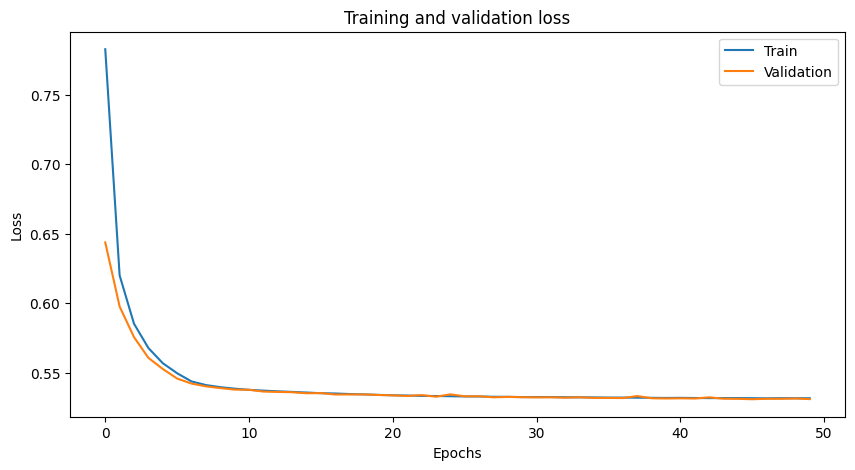

In [102]:
plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Y el accuracy:

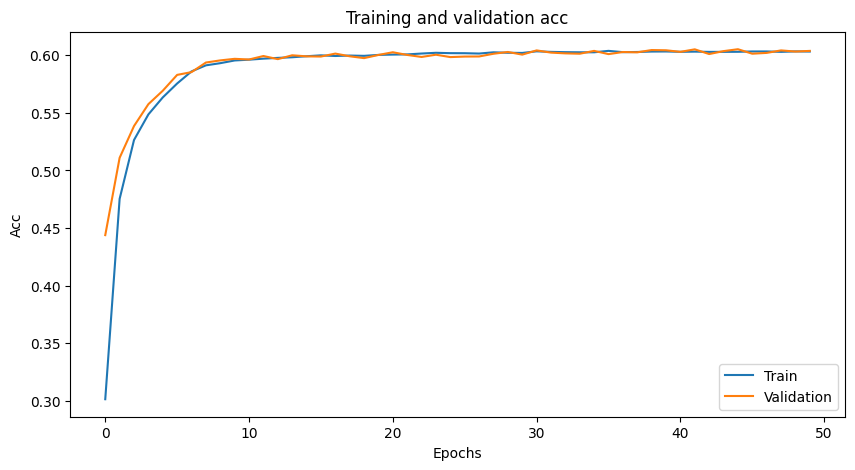

In [103]:
plt.plot(history.history['acc'], label='Train')
plt.plot(history.history['val_acc'], label='Validation')
plt.title('Training and validation acc')
plt.xlabel('Epochs')
plt.ylabel('Acc')
plt.legend()
plt.show()

#### 4.2. Predicciones y reconstrucciones

Vemos las predicciones

In [104]:
predicted = autoencoder.predict(X_new_train)
pd.DataFrame(predicted)

1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 264us/step


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.0,1.947088,0.000000,0.000000,1.410334,0.0,0.000000,0.0,0.0,0.0,0.0,2.252014,0.000000,0.000000,0.000000,0.0,0.000000,0.0
1,0.0,0.000000,0.000000,0.029207,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.242172,0.018034,0.0,0.000000,0.0
2,0.0,0.000000,0.928779,0.000000,0.151509,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.236435,0.0,0.000000,0.0
3,0.0,0.000000,0.000000,0.787857,0.778930,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,1.149617,0.0,0.000000,0.0
4,0.0,0.000000,0.000000,0.130391,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.179737,0.000000,0.0,3.437818,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,0.0,0.515464,0.918025,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,5.144204,0.000000,0.0,0.000000,0.0
61218,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.356876,0.205610,0.000000,0.000000,0.0,0.000000,0.0
61219,0.0,2.082742,0.000000,2.215585,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.201647,1.192306,0.0,0.000000,0.0
61220,0.0,0.000000,0.952728,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.933402,1.310650,0.867570,0.0,0.000000,0.0


Calculemos ahora el error en entrenamiento:

In [105]:
error = tf.keras.losses.mean_squared_error(X_new_train, predicted).numpy()
error

array([0.4087286 , 0.46727127, 1.1468269 , ..., 0.8071014 , 0.3919233 ,
       0.18446743], dtype=float32)

/var/folders/r5/cc3y743j5ys_g9v6b67d72jh0000gn/T/ipykernel_78293/3907934883.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error)


<Axes: ylabel='Density'>

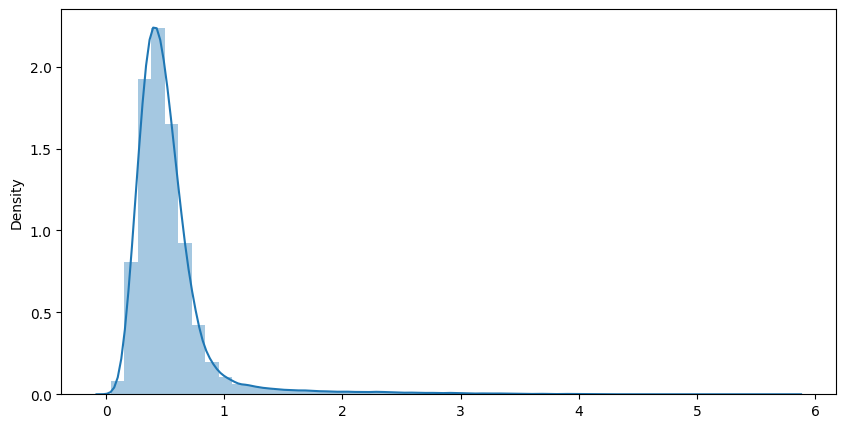

In [106]:
plt.rcParams['figure.figsize'] = [10, 5]

sns.distplot(error)

Y establecemos un valor el cual nos dirá que presenta un "comportamiento extraño". En este caso, será el cuantil 94.5, dado que es la proporción entre fraudes y normales en los datos analizados.

0.9705760714411722


/var/folders/r5/cc3y743j5ys_g9v6b67d72jh0000gn/T/ipykernel_78293/819768229.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error)


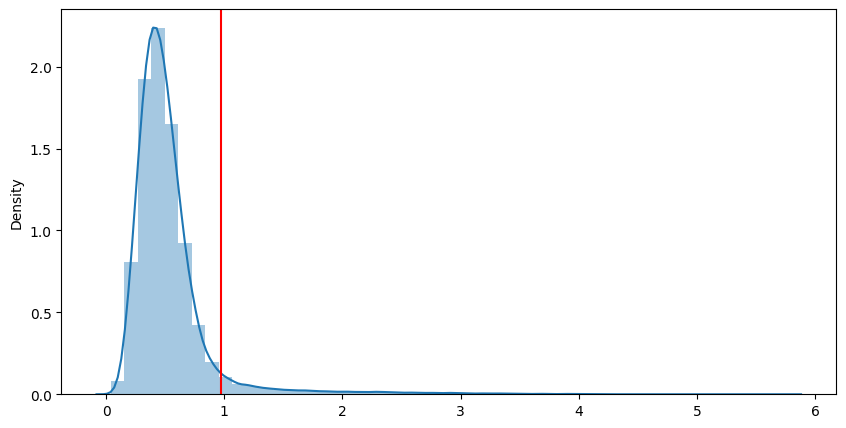

In [107]:
q = np.quantile(error, (0.945))
print(q)

sns.distplot(error)
plt.axvline(q, 0, 1, color = 'red')
plt.show()

Debemos procesar los datos de test con los mismos pasos del entrenamiento:

In [108]:
X_new_test = pipe.transform(X_test)
X_new_test

array([[-0.36888089, -0.50413766,  1.69460781, ..., -0.21522401,
        -0.15305407,  0.01208451],
       [ 0.84119702,  1.2297269 , -0.20181671, ..., -0.21240076,
        -0.14888605, -0.16480681],
       [-1.59870199, -1.50430735, -1.64123165, ..., -0.2167063 ,
        -0.16730528, -0.32181894],
       ...,
       [ 1.46256898,  1.89241903, -0.66304497, ..., -0.21414033,
        -0.16277075, -0.06340614],
       [-0.48853657,  0.68917418, -1.03385821, ..., -0.20974012,
        -0.16500136, -0.2916195 ],
       [-0.34231733, -0.2166931 , -0.0917857 , ..., -0.2167063 ,
        -0.16730528, -0.32181894]])

En el paso anterior usamos el pipeline para que los datos de prueba fueran normalizados con los mismos pasos de entrenamiento, ahora lo vamos a pasar por el autoencoder ya entrenado.

In [109]:
reconstructions = autoencoder.predict(X_new_test)
pd.DataFrame(reconstructions)

904/904 ━━━━━━━━━━━━━━━━━━━━ 0s 467us/step


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.0,0.000000,1.637002,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.16812,1.086722,0.000000,0.0,0.0,0.0
1,0.0,1.188217,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0
2,0.0,0.000000,0.000000,0.001703,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0
3,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,3.508901,0.0,0.0,0.0
4,0.0,2.427845,0.000000,1.880376,0.540444,0.0,2.152725,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28907,0.0,0.000000,0.916882,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.315839,0.0,0.0,0.0
28908,0.0,0.359612,0.000000,0.000000,0.000000,0.0,3.177283,0.0,0.0,0.0,0.0,2.099689,0.00000,1.384540,0.000000,0.0,0.0,0.0
28909,0.0,1.955366,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.00000,0.275183,0.000000,0.0,0.0,0.0
28910,0.0,0.682233,0.000000,0.000000,0.667281,0.0,0.059915,0.0,0.0,0.0,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.0,0.0


Calculemos el error cuadrático medio en las reconstrucciones para cada uno de los pacientes:

In [110]:
mse = np.mean(np.power(X_new_test - reconstructions, 2), axis=1)

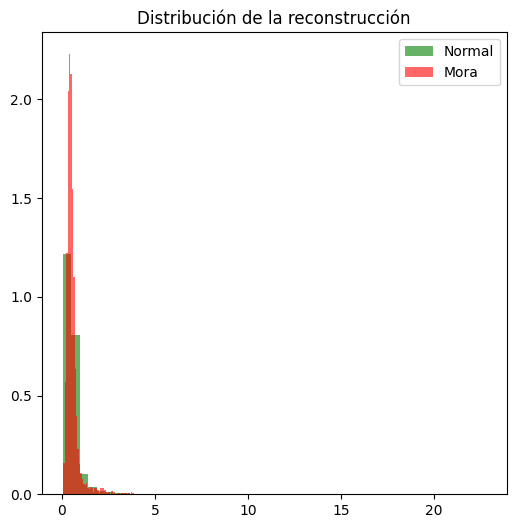

In [111]:
normal_ = mse[Y_test==0]
mora_ = mse[Y_test==1]

fig, ax = plt.subplots(figsize=(6,6))

ax.hist(normal_, bins=50, density=True, label="Normal", alpha=.6, color="green")
ax.hist(mora_, bins=50, density=True, label="Mora", alpha=.6, color="red")

plt.title("Distribución de la reconstrucción")
plt.legend()
plt.show()

¿Podemos diferenciar la clase normal de los enfermos?, ¿qué opinas?

Obtenemos los nuevos errores de este nuevo conjunto de datos.

In [112]:
error_test = tf.keras.losses.mean_squared_error(X_new_test, reconstructions).numpy()
error_test

array([0.62977946, 0.36253986, 0.76901525, ..., 0.5271713 , 0.43838775,
       0.45849112], dtype=float32)

Y vemos el comportamiento utilizando el mismo "punto de corte" que el que establecimos anteriormente.

/var/folders/r5/cc3y743j5ys_g9v6b67d72jh0000gn/T/ipykernel_78293/2888007264.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error_test)


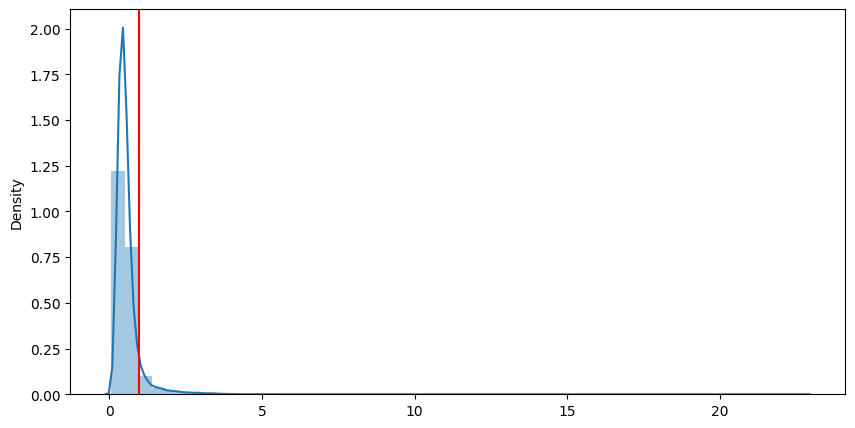

In [113]:
sns.distplot(error_test)
plt.axvline(q, 0, 1, color = 'red')
plt.show()

#### 4.4. Umbrales

En este caso conocemos las etiquetas, por lo tanto podemos verificar los resultados, usando umbrales.

In [114]:
y_pred = (error_test > q).astype(int)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [115]:
from sklearn.metrics import classification_report


print("----- Classification Report for outliers -----")
print(classification_report(Y_test, y_pred))

----- Classification Report for outliers -----
              precision    recall  f1-score   support

           0       0.89      0.92      0.91     25792
           1       0.09      0.06      0.07      3120

    accuracy                           0.83     28912
   macro avg       0.49      0.49      0.49     28912
weighted avg       0.80      0.83      0.82     28912



#### 4.5. Análisis e interpretación de resultados

Los resultados sugieren que el modelo tiene resultados deficientes en la detección de anomalías (clase 1), tiene una baja precisión y una cobertura aún más baja. Esto indica que aunque en las gráficas de pérdida esta disminuía y en las de accuracy esta aumentaba, hay que mejorar el modelo. Se hicieron diferentes intentos tomando diferentes columnas y con ninguno se tenía un buen rendimiento, por lo que se piensa que puede ser que las variables proporcionadas no son indicativas de si alguien está en mora o no o incluso podría llegar a indicarnos que hay un problema con la calidad de los datos. Lo anterior, debido a que parece ser que los datos anomálos se comportan igual que los normales. 

#### 4.6. Otros modelos probados

Se documentarán algunos de los múltiples intentos realizados para mejorar el modelo.
Todos los modelos que se presentaran a continuación tenían la misma arquitectura, es decir:

```python
#Encoder
autoencoder.add(Input(shape=(INPUT_DIM,))) #Capa de Entrada
autoencoder.add(Dense(16, activation='relu'))
autoencoder.add(Dense(8, activation='relu'))

#Decoder
autoencoder.add(Dense(16, activation='relu'))
autoencoder.add(Dense(INPUT_DIM, activation='relu'))
```

1. Modelo #1:
Se tomaron las variables: Loan Amount, Funded Amount, Funded Amount Investor, Term, Interest Rate, Grade, Employment Duration, Home Ownership, Verification Status, Debit to Income, Open Account, Revolving Balance, Revolving Utilities, Total Accounts, Total Received Interest, Total Received Late Fee, Recoveries, Collection Recovery Fee, Last week Pay, Total Collection Account, Total Current Balance, Total Revolving Credit Limit. A las variables numéricas se les aplicó un `StandardScaler()` y a las categóricas un `OneHotEncoder()`. Para este modelo se obtuvo: Se obtuvieron los siguientes resultados:

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.92 | 0.91 | 25792 |
| 1 | 0.09 | 0.07 | 0.08 | 3120 |
| accuracy |  |  | 0.83 | 28912 |
| macro avg | 0.49 | 0.49 | 0.49 | 28912 | 
| weighted avg | 0.81 | 0.83 | 0.82 | 28912 |

2. Modelo #2:
Si se tomaban las mismas variables del modelo #1, a excepción de: Total Received Late Fee, Recoveries y Collection Recovery Fee, y se le hacía el mismo tratamiento de datos, se obtenían los siguientes resultados:

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.89 | 0.89 | 25792 |
| 1 | 0.08 | 0.08 | 0.08 | 3120 |
| accuracy |  |  | 0.81 | 28912 |
| macro avg | 0.48 | 0.49 | 0.49 | 28912 |
| weighted avg | 0.80 | 0.81 | 0.80 | 28912 |

3. Modelo #3:
Ahora, si se toman las mismas variables del modelo #2, pero se agregan Delinquency : two years y Inquires : six months y se le hacía el mismo tratamiento a los datos, se obtenían los siguientes resultados:   

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.89 | 0.89 | 25792 |
| 1 | 0.08 | 0.08 | 0.08 | 3120 |
| accuracy |  |  | 0.81 | 28912 |
| macro avg | 0.48 | 0.49 | 0.49 | 28912 |
| weighted avg | 0.80 | 0.81 | 0.80 | 28912 |

4. Modelo #4:
Si se tomaban las mismas variables del modelo #3, pero cambiando lo siguiente del tratamiento de datos: todas las variables numéricas eran tratadas con un `StandardScaler()` a excepción de Revolving Balance, Total Received Interest, Total Current Balance y Total Revolving Credit Limit, las cuales fueron tratadas con un `MinMaxScaler()` y luego con un `Normalizer()`. Se obtuvieron los siguientes resultados:

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.90 | 0.90 | 25792 |
| 1 | 0.08 | 0.07 | 0.07 | 3120 |
| accuracy |  |  | 0.81 | 28912 |
| macro avg | 0.48 | 0.49 | 0.48 | 28912 |
| weighted avg | 0.80 | 0.81 | 0.81 | 28912 |

5. Modelo #5:
Si se hacía lo mismo que en el modelo #4 pero sin el `Normalizer()`, se obtenían los siguientes resultados:

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.89 | 0.89 | 25792 |
| 1 | 0.07 | 0.07 | 0.07 | 3120 |
| accuracy |  |  | 0.80 | 28912 |
| macro avg | 0.48 | 0.48 | 0.48 | 28912 |
| weighted avg | 0.80 | 0.80 | 0.80 | 28912 |

------------

En este punto se decidió cambiar la arquitectura de la red a la usada actualmente: 
    
```python
    #Encoder
    autoencoder.add(Input(shape=(INPUT_DIM,))) #Capa de Entrada
    autoencoder.add(Dense(10, activation='relu'))
    autoencoder.add(Dense(5, activation='relu'))

    #Decoder
    autoencoder.add(Dense(10, activation='relu'))
    autoencoder.add(Dense(INPUT_DIM, activation='relu'))
```

6. Modelo #6:
No se observaron mejorías por hacer un tratamiento diferenciado a las variables numéricas, por lo que se decidió no hacerlo. Por otro lado, las variables que se decidieron usar fueron las mismas que en el modelo #5 e incluyendo Total Received Late Fee, Recoveries, Collection Recovery Fee y Public Record, pero eliminando las categóricas, se obtuvieron los siguientes resultados:

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.92 | 0.91 | 25792 |
| 1 | 0.11 | 0.08 | 0.09 | 3120 |
| accuracy |  |  | 0.83 | 28912 |
| macro avg | 0.50 | 0.50 | 0.50 | 28912 |
| weighted avg | 0.81 | 0.83 | 0.82 | 28912 |


7. Modelo #7: Modelo escogido
Con el mismo modelo #6, pero eliminando las variables: Delinquency - two years, Inquires - six months y Public Record, se obtuvieron los siguientes resultados:

|  | precision | recall | f1-score | support |
| --- | --- | --- | --- | --- |
| 0 |  0.89 | 0.93 | 0.91 | 25792 |
| 1 | 0.11 | 0.07 | 0.09 | 3120 |
| accuracy |  |  | 0.84 | 28912 |
| macro avg | 0.50 | 0.50 | 0.50 | 28912 |
| weighted avg | 0.81 | 0.84 | 0.82 | 28912 |

Cabe resaltar que todas estas pruebas fueron usando un umbral o q de:
`q = np.quantile(error, (0.935))`, este valor fue después modificado a 0.945 y es por eso que las métricas presentadas en celdas anteriores no coinciden o son iguales a estas últimas mostradas. Por otro lado, aunque los desempeños entre modelos son muy parecidos, se escogió este último porque fue el que mejor accuracy y f1-score tuvo tanto para la clase 0 (normal) como para la clase 1 (anómala).


## Punto 5: Identificación de hiperparámetros

### Búsqueda de hiperparámetros
Los hiperparámetros que se decidieron explorar fueron: optimizer, activation y batch_size. A continuación, se define cada uno de los parámetros:
- Optimizer: El optimizador es el algoritmo usado para actualizar los pesos de la red neuronal durante el entrenamiento. Algunos optimizadores comunes son SGD (Stochastic Gradient Descent), Adam, RMSProp, Adagrad, entre otros. La elección del optimizador puede tener un impacto significativo en la velocidad de entrenamiento y en la convergencia del modelo a mejores resultados.
- Activation: La función de activación determina la salida de cada neurona en la red. Algunas funciones de activación comunes son ReLU (Rectified Linear Unit), Sigmoid, Tanh, entre otras. La función de activación elegida puede afectar la capacidad de aprendizaje, por lo que se decidió seleccionar este parámetro.
- Batch Size: El batch size se refiere al número de muestras que se pasan a través de la red neuronal antes de que se actualicen los pesos. Un batch size más pequeño puede resultar en una actualización más frecuente de los pesos, pero puede requerir más pasos de entrenamiento. Se espera que para un batch size más grande, el modelo converja más rápido. 

In [141]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras_tuner import RandomSearch

def build_model(hparam):
    autoencoder = Sequential()
    
    activation = hparam.Choice("activation", ["relu", "tanh", "sigmoid"])
    optimizer = hparam.Choice("optimizer", ["adam", "rmsprop", "sgd"])
    hparam.Int("batch_size", min_value=20, max_value=40, step=10)
    
    #Encoder
    autoencoder.add(Input(shape=(INPUT_DIM,))) #Capa de Entrada
    autoencoder.add(Dense(10, activation=activation))
    autoencoder.add(Dense(5, activation=activation))

    #Decoder
    autoencoder.add(Dense(10, activation=activation))
    autoencoder.add(Dense(INPUT_DIM, activation=activation))

    autoencoder.compile(loss='mse', optimizer=optimizer, metrics=["acc"])

    return autoencoder

tuner = RandomSearch(build_model, objective='val_loss', max_trials=27, executions_per_trial=3,
                        directory='my_dir', project_name='Autoencoder_Hyperparameter_Tuning')

early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.0001, patience=10, verbose=1, mode='min',restore_best_weights=True)

tuner.search(X_new_train, X_new_train, epochs=50, validation_data=(X_new_train,X_new_train), callbacks=[early_stopping])

Trial 27 Complete [00h 02m 38s]
val_loss: 0.6314823230107626

Best val_loss So Far: 0.5414937734603882
Total elapsed time: 03h 52m 22s


In [142]:
best_model = tuner.get_best_models(num_models=1)[0]
best_model

/Users/mariacatalinaibanezpineres/Desktop/MAESTRIA/2024-10/Machine Learning/Talleres/Taller5/env/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


<Sequential name=sequential, built=True>

In [168]:
best_hyperparams = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Los mejores hiperparámetros:")
hyperparams_list = ["activation", "optimizer", "batch_size"]

for h in hyperparams_list:
  print(f"{h}: {best_hyperparams.get(h)}")

Los mejores hiperparámetros:
activation: relu
optimizer: adam
batch_size: 30


## Punto 6: Reconstrucción de resultados

#### 6.1. Reconstrucción

In [150]:
predicted = best_model.predict(X_new_train)
pd.DataFrame(predicted)

1914/1914 ━━━━━━━━━━━━━━━━━━━━ 1s 379us/step


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.0,1.407664,0.0,0.000000,1.138343,0.00000,0.000000,0.0,0.0,0.000000,0.57081,1.993256,0.0,0.000000,0.000000,0.000000,0.00000,0.0
1,0.0,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.0,0.939243,0.00000,0.000000,0.0,0.296300,0.000000,0.000000,0.00000,0.0
2,0.0,0.000000,0.0,0.072123,0.000000,0.35011,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,3.435049,0.00000,0.0
3,0.0,0.000000,0.0,1.403901,0.924092,0.00000,0.020208,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.000000,1.733682,0.000000,0.00000,0.0
4,0.0,0.000000,0.0,0.303372,0.000000,0.00000,0.126982,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.065165,0.000000,2.932512,3.48634,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61217,0.0,0.000000,0.0,0.655011,0.000000,0.00000,0.000000,0.0,0.0,1.954311,0.00000,0.000000,0.0,4.897200,0.000000,0.000000,0.00000,0.0
61218,0.0,0.000000,0.0,0.000000,0.022401,0.00000,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.0
61219,0.0,0.231257,0.0,0.000000,0.000000,0.00000,0.013010,0.0,0.0,1.516900,0.00000,0.000000,0.0,0.331144,0.839360,0.000000,0.00000,0.0
61220,0.0,0.000000,0.0,0.336391,0.000000,0.00000,0.000000,0.0,0.0,0.000000,0.00000,0.000000,0.0,1.436265,0.744377,0.000000,0.00000,0.0


In [151]:
error = tf.keras.losses.mean_squared_error(X_new_train, predicted).numpy()
error

array([0.4826366 , 0.42560452, 0.55378866, ..., 1.1182686 , 0.46381125,
       0.28590453], dtype=float32)

/var/folders/r5/cc3y743j5ys_g9v6b67d72jh0000gn/T/ipykernel_78293/4268593782.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error)


<Axes: ylabel='Density'>

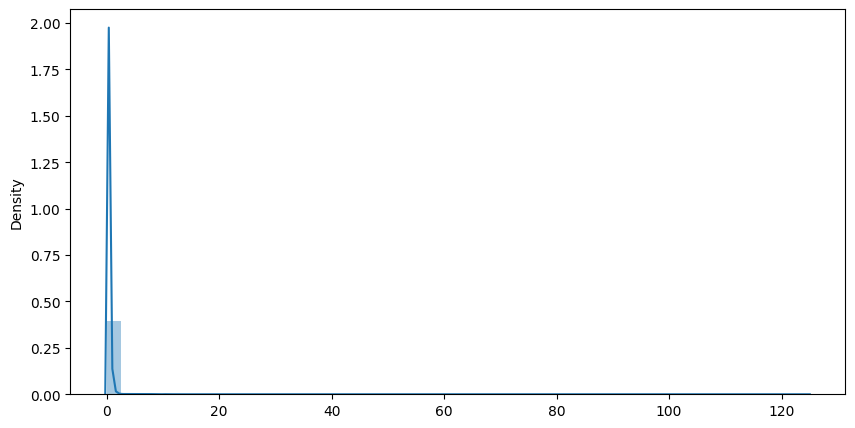

In [156]:
plt.rcParams['figure.figsize'] = [10, 5]
sns.distplot(error)

0.9627830755710601


/var/folders/r5/cc3y743j5ys_g9v6b67d72jh0000gn/T/ipykernel_78293/819768229.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error)


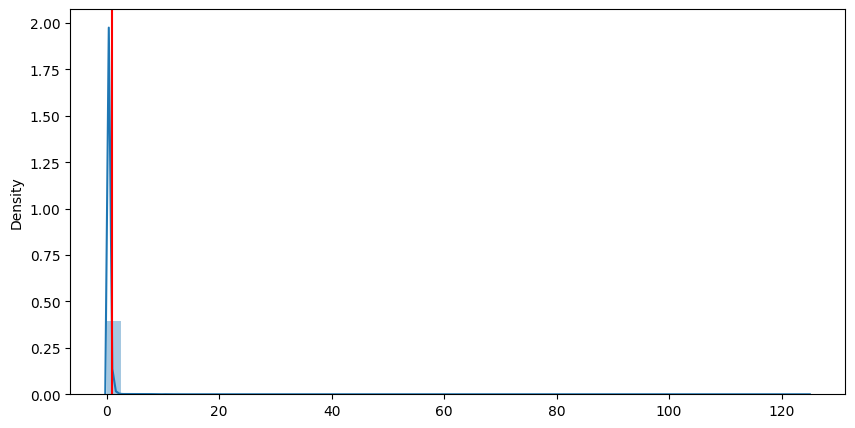

In [157]:
q = np.quantile(error, (0.945))
print(q)

sns.distplot(error)
plt.axvline(q, 0, 1, color = 'red')
plt.show()

In [160]:
reconstructions = best_model.predict(X_new_test)
pd.DataFrame(reconstructions)

904/904 ━━━━━━━━━━━━━━━━━━━━ 0s 286us/step


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.0,0.000000,0.0,0.356855,0.000000,0.000000,0.000000,0.0,2.011091,0.000000,0.00000,0.006539,0.0,1.155589,0.000000,0.0,0.0,0.0
1,0.0,1.012170,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.043274,0.000000,0.0,0.0,0.0
2,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.041917,0.0,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,3.026178,0.0,0.0,0.0
4,0.0,1.305978,0.0,0.000000,0.650326,0.000000,1.828125,0.0,0.000000,0.988619,0.11307,0.000000,0.0,0.000000,0.141463,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28907,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,1.081228,0.000000,0.00000,0.000000,0.0,0.000000,0.217124,0.0,0.0,0.0
28908,0.0,0.000000,0.0,0.000000,0.000000,0.000000,1.629106,0.0,0.000000,0.000000,0.00000,0.000000,0.0,1.379563,0.000000,0.0,0.0,0.0
28909,0.0,1.870790,0.0,0.000000,0.000000,1.298269,0.000000,0.0,0.745699,0.000000,0.00000,0.071495,0.0,0.378786,0.000000,0.0,0.0,0.0
28910,0.0,0.594410,0.0,0.000000,0.568550,0.806004,0.000000,0.0,0.000000,0.000000,0.00000,0.041950,0.0,0.000000,0.000000,0.0,0.0,0.0


In [161]:
mse = np.mean(np.power(X_new_test - reconstructions, 2), axis=1)

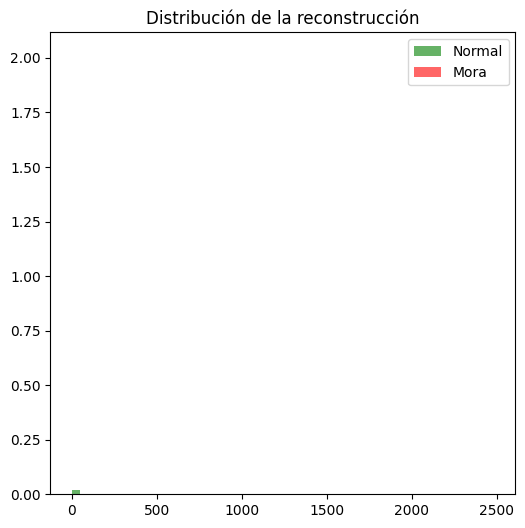

In [162]:
normal_ = mse[Y_test==0]
mora_ = mse[Y_test==1]

fig, ax = plt.subplots(figsize=(6,6))

ax.hist(normal_, bins=50, density=True, label="Normal", alpha=.6, color="green")
ax.hist(mora_, bins=50, density=True, label="Mora", alpha=.6, color="red")

plt.title("Distribución de la reconstrucción")
plt.legend()
plt.show()

In [163]:
error_test = tf.keras.losses.mean_squared_error(X_new_test, reconstructions).numpy()
error_test

array([0.59672433, 0.3654482 , 0.76892877, ..., 0.4083542 , 0.4067829 ,
       0.45784092], dtype=float32)

In [164]:
y_pred = (error_test > q).astype(int)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [165]:
from sklearn.metrics import classification_report


print("----- Classification Report for outliers -----")
print(classification_report(Y_test, y_pred))

----- Classification Report for outliers -----
              precision    recall  f1-score   support

           0       0.89      0.93      0.91     25792
           1       0.09      0.05      0.07      3120

    accuracy                           0.84     28912
   macro avg       0.49      0.49      0.49     28912
weighted avg       0.80      0.84      0.82     28912



#### 6.2. Análisis de resultados

Como se mencionó en el punto 4, los resultados sugieren que el modelo tiene resultados deficientes en la detección de anomalías (clase 1), se nota una leve mejoría en el accuracy (0.83 --> 0.84); no obstante, es mínimo el cambio y el rendimiento sigue siendo deficiente. Nótese que en la búsqueda de hiperparámetros el mejor modelo fue el que tiene las mismas condiciones que el model base, excepto porque el batch size es de 30 y no de 32. Finalmente una posible conclusión del bajo desempeño del modelo como mencionado antes puede ser que las variables proporcionadas no son indicativas de si alguien está en mora o no o incluso podría llegar a indicarnos que hay un problema con la calidad de los datos. Lo anterior, debido a que parece ser que los datos anomálos se comportan igual que los normales. 

## Punto 7: Bono

#### 7.1. Se almacena en un joblib el preprocesamiento de los datos

In [170]:
import joblib
joblib.dump(pipe, 'preprocessor_pipeline.joblib')

['preprocessor_pipeline.joblib']

#### 7.2. Se almacena en un .h5 el mejor modelo

In [171]:
best_model.save('anomaly_detection_model.h5')

Como indicado en el enunciado, en la última linea se deja la variable `encoder_fields` con las columnas que finalmente se usaron en el modelo. Tener en cuenta que las columnas `Home Ownership` y `Employment Duration` fueron intercambiadas.

In [ ]:
encoder_fields =  ["Loan Amount", "Funded Amount", "Funded Amount Investor", "Interest Rate", "Employment Duration", 
                       "Debit to Income", "Open Account", "Revolving Utilities","Total Accounts",  "Last week Pay", 
                       "Total Collection Amount", "Revolving Balance", "Total Received Interest", "Total Current Balance",
                       "Total Revolving Credit Limit", "Total Received Late Fee", "Recoveries", "Collection Recovery Fee"]